In [4]:
import numpy as np
import pandas as pd

from datetime import datetime, timedelta

import random

In [22]:
transactions = pd.read_csv("PurchasesLog.csv")
transactions.PurchaseDate = pd.to_datetime(transactions.PurchaseDate)
transactions.DeliveryDate = pd.to_datetime(transactions.DeliveryDate)
display(transactions.head())
display(transactions.dtypes)

C:\Users\steve\miniconda3\envs\streaming\lib\site-packages\dateutil\parser\_parser.py:1213: UnknownTimezoneWarning: tzname CDT identified but not understood.  Pass `tzinfos` argument in order to correctly return a timezone-aware datetime.  In a future version, this will raise an exception.
  warnings.warn("tzname {tzname} identified but not understood.  "


,CustomerID,FirstName,LastName,CreditCardNumber,OrderID,PurchaseDate,DeliveryDate,ShippingClass,ProductID,Department,...,Friends,SharedWith,ZipCodeInSupplyChainNet,CityInSupplyChainNet,StateInSupplyChainNet,LatitudeInSupplyChainNet,LongitudeInSupplyChainNet,FacilityIDInSupplyChainNet,DistributionCenterIDInSupplyChainNet,WarehouseIDInSupplyChainNet
0,067-03-5110,Cary,Mosciski,xxxx-xxxx-xxxx-0112,35e3cd2f-1754-4e76-9a36-90b787a9e09c,2021-05-04 19:09:43,2021-05-05 19:03:09,Next Day,CLO-SH-0136-865,Clothing,...,NaN,NaN,30322,Atlanta,GA,33.793754,-84.3238,NaN,DistributionCenter_89,Warehouse_16
1,379-81-0765,Rosalee,Mayert,xxxx-xxxx-xxxx-5730,55869978-15a1-483a-bedc-58e077a9c618,2021-05-04 19:08:25,2021-05-09 19:07:20,Standard,ELE-PH-0848-053,Electronics,...,NaN,NaN,75353,Dallas,TX,32.767268,-96.777626,NaN,DistributionCenter_71,Warehouse_19
2,837-66-0688,Janet,Hane,xxxx-xxxx-xxxx-4536,81907ebe-fb03-477e-beff-762c744b2f9b,2021-05-04 19:00:51,2021-05-09 19:11:24,Standard,GRO-NU-2799-197,Grocery,...,NaN,NaN,2283,Boston,MA,42.338947,-70.919635,DistributionCenter_32,DistributionCenter_32,Warehouse_11
3,624-30-8030,Sarina,Macejkovic,xxxx-xxxx-xxxx-2356,fcdb2e71-cc75-4df6-b03b-9e4b36339fa8,2021-05-04 19:06:58,2021-05-06 19:11:18,Two Day,FUR-TA-9688-003,Furniture,...,NaN,NaN,11302,New York,NY,40.75945,-73.715016,NaN,DistributionCenter_20,Warehouse_7
4,893-62-1144,Shane,Daugherty,xxxx-xxxx-xxxx-2845,ccbb9640-7738-4488-b45d-776bceb01f56,2021-05-04 19:09:42,2021-05-09 18:59:19,Standard,SPO-AT-4470-799,Sports,...,NaN,NaN,60667,Chicago,IL,41.811929,-87.68732,NaN,DistributionCenter_1,Warehouse_1


CustomerID                                      object
FirstName                                       object
LastName                                        object
CreditCardNumber                                object
OrderID                                         object
PurchaseDate                            datetime64[ns]
DeliveryDate                            datetime64[ns]
ShippingClass                                   object
ProductID                                       object
Department                                      object
Category                                        object
ItemPurchased                                   object
Quantity                                         int64
Price                                          float64
ShippingCost                                   float64
Discount                                       float64
Sales                                          float64
Profit                                         float64
Distributi

<div class="alert alert-success">  
    
# 1) Detect fake or BOT-generated ratings/reviews utilizing rules
    

</div>

<div class="alert alert-info">
    
method suggestions: 
- High volume of ratings of a certain product in a short time span
- Multiple ratings of the same product from the same user in 2 or more zip codes in a short period of time
    
i'll create a dataset that has randomly replicated reviews

In [17]:
# reviews are uncommon, so i'll convert the transactions dataset to reviews

transactions.ReviewID.value_counts(sort=True, ascending=False, dropna=False)

NaN           4975
39bf6-90c2       1
8bdde-b44e       1
245ec-c25a       1
4977a-55cc       1
              ... 
e10a9-11cd       1
39a23-7b90       1
23c3e-93a8       1
e4efe-44e2       1
bdbb1-9eb6       1
Name: ReviewID, Length: 5026, dtype: int64

<AxesSubplot:xlabel='PurchaseDate'>

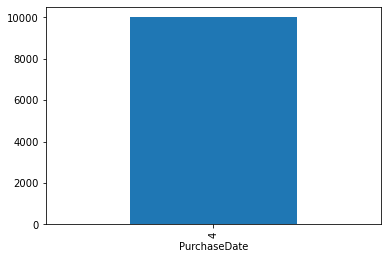

In [24]:
# check for distribution across dates. this was data generated by kafka with real transaction times, 
# so those will need to be synthesized

transactions.PurchaseDate.groupby(transactions["PurchaseDate"].dt.date).count().plot(kind="bar")


In [27]:
# need to vary the dates so we have the possibility for seasonality

def random_dates(start, end, n=10):
    if not isinstance(start, datetime):
        start = pd.to_datetime(start)
    if not isinstance(end, datetime):
        end = pd.to_datetime(end)
    
    start_u = start.value//10**9
    end_u = end.value//10**9

    return pd.to_datetime(np.random.randint(start_u, end_u, n), unit='s')

transactions.PurchaseDate = random_dates('2017-01-01', '2020-01-01', len(transactions.PurchaseDate))
transactions

,CustomerID,FirstName,LastName,CreditCardNumber,OrderID,PurchaseDate,DeliveryDate,ShippingClass,ProductID,Department,...,Friends,SharedWith,ZipCodeInSupplyChainNet,CityInSupplyChainNet,StateInSupplyChainNet,LatitudeInSupplyChainNet,LongitudeInSupplyChainNet,FacilityIDInSupplyChainNet,DistributionCenterIDInSupplyChainNet,WarehouseIDInSupplyChainNet
0,067-03-5110,Cary,Mosciski,xxxx-xxxx-xxxx-0112,35e3cd2f-1754-4e76-9a36-90b787a9e09c,2019-06-16 09:17:41,2021-05-05 19:03:09,Next Day,CLO-SH-0136-865,Clothing,...,NaN,NaN,30322,Atlanta,GA,33.793754,-84.3238,NaN,DistributionCenter_89,Warehouse_16
1,379-81-0765,Rosalee,Mayert,xxxx-xxxx-xxxx-5730,55869978-15a1-483a-bedc-58e077a9c618,2017-12-07 04:22:47,2021-05-09 19:07:20,Standard,ELE-PH-0848-053,Electronics,...,NaN,NaN,75353,Dallas,TX,32.767268,-96.777626,NaN,DistributionCenter_71,Warehouse_19
2,837-66-0688,Janet,Hane,xxxx-xxxx-xxxx-4536,81907ebe-fb03-477e-beff-762c744b2f9b,2017-04-07 22:43:45,2021-05-09 19:11:24,Standard,GRO-NU-2799-197,Grocery,...,NaN,NaN,2283,Boston,MA,42.338947,-70.919635,DistributionCenter_32,DistributionCenter_32,Warehouse_11
3,624-30-8030,Sarina,Macejkovic,xxxx-xxxx-xxxx-2356,fcdb2e71-cc75-4df6-b03b-9e4b36339fa8,2019-04-01 05:46:17,2021-05-06 19:11:18,Two Day,FUR-TA-9688-003,Furniture,...,NaN,NaN,11302,New York,NY,40.75945,-73.715016,NaN,DistributionCenter_20,Warehouse_7
4,893-62-1144,Shane,Daugherty,xxxx-xxxx-xxxx-2845,ccbb9640-7738-4488-b45d-776bceb01f56,2017-02-13 15:17:49,2021-05-09 18:59:19,Standard,SPO-AT-4470-799,Sports,...,NaN,NaN,60667,Chicago,IL,41.811929,-87.68732,NaN,DistributionCenter_1,Warehouse_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,373-28-8486,Eusebio,Raynor,xxxx-xxxx-xxxx-4991,15200b7a-8158-4800-9ae5-29ee5c157308,2018-12-03 00:30:25,2021-05-06 19:11:55,Two Day,OFF-AP-6460-365,Office Supplies,...,769-61-1076;881-85-0034,769-61-1076,33132,Miami,FL,25.784326,-80.18753,NaN,DistributionCenter_58,Warehouse_17
9996,614-86-2091,Myrtice,King,xxxx-xxxx-xxxx-5881,61da7732-dcf4-4d5c-bab6-129661a7f226,2017-02-19 14:43:55,2021-05-05 19:22:14,Next Day,SPO-GO-3297-200,Sports,...,NaN,NaN,10114,New York,NY,40.780751,-73.977182,NaN,DistributionCenter_15,Warehouse_5
9997,733-78-6363,Otha,Hettinger,xxxx-xxxx-xxxx-1430,37141b26-b25a-4818-9698-ad787f3fce4b,2018-08-02 10:02:21,2021-05-09 19:08:16,Standard,ELE-CO-7514-121,Electronics,...,572-82-9133,NaN,10250,New York,NY,40.709387,-74.016529,DistributionCenter_14,DistributionCenter_14,Warehouse_5
9998,303-75-9064,Shyanne,Harber,xxxx-xxxx-xxxx-6925,ebee6e9e-8c13-4c7a-9d08-d57c7a35de15,2019-08-16 17:59:23,2021-05-09 19:19:44,Standard,GRO-PA-0127-890,Grocery,...,809-96-0961;099-01-3334,809-96-0961;099-01-3334,30881,Atlanta,GA,33.793006,-84.504081,DistributionCenter_89,DistributionCenter_89,Warehouse_16


<AxesSubplot:xlabel='PurchaseDate'>

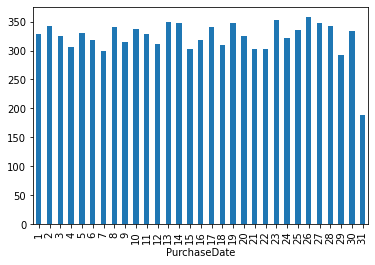

In [28]:
transactions.PurchaseDate.groupby(transactions["PurchaseDate"].dt.date).count() \
            .plot(kind="bar", figsize=(40,10))

# need to work to a less even distrubution

In [103]:
ts_analysis_df = transactions[['PurchaseDate', 'ItemPurchased', 'Quantity']] \
    .rename(columns={'PurchaseDate':'ReviewDate'})


In [104]:
# make 100 days when randomly higher number of orders were placed
import random

for i in range(200):
    row_choice_rand = random.randint(0, len(transactions))
    x_rand = random.randint(0, 50) # random number of times to replicate the row
    row = ts_analysis_df.iloc[row_choice_rand] # row to replicate
    if not i % 10 == 0: # every 10th row, allow the product name to stay the same
        row.ItemPurchased = transactions.iloc[random.randint(0, len(transactions))].ItemPurchased
    ts_analysis_df = ts_analysis_df.append([row]*x_rand,ignore_index=True)
    
ts_analysis_df

C:\Users\steve\miniconda3\envs\streaming\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


,ReviewDate,ItemPurchased,Quantity
0,2019-06-16,Champion Men's Sportswear Shorts,2
1,2017-12-07,Motorola Smart Phone,2
2,2017-04-07,Planters Deluxe Lightly Salted Whole Cashews,3
3,2019-04-01,Computer Table - Bottom Storage,2
4,2017-02-13,Under Armour Men's HeatGear,2
...,...,...,...
14903,2018-09-19,Casuals Pocket T-Shirt,4
14904,2018-09-19,Casuals Pocket T-Shirt,4
14905,2018-09-19,Casuals Pocket T-Shirt,4
14906,2018-09-19,Casuals Pocket T-Shirt,4


In [ ]:
ts_analysis_df.ReviewDate = random_dates('2017-01-01', '2020-01-01', len(ts_analysis_df.ReviewDate))

<AxesSubplot:xlabel='ReviewDate'>

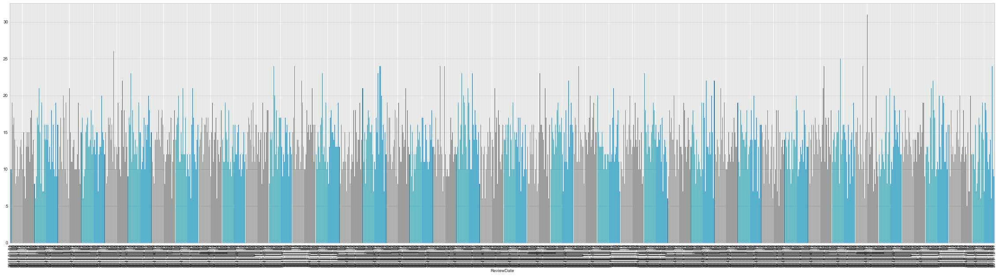

In [105]:
ts_analysis_df.ReviewDate.groupby(ts_analysis_df["ReviewDate"].dt.date).count() \
                .plot(kind="bar", figsize=(40,10))

<div class="alert alert-info">
    
use the adtk package to look for time series anomolies

In [53]:
!pip install adtk

  Using cached tabulate-0.8.9-py3-none-any.whl (25 kB)
  Using cached threadpoolctl-2.1.0-py3-none-any.whl (12 kB)


In [131]:
from adtk.data import validate_series

ts_analysis_df["ReviewDate"] = pd.to_datetime(ts_analysis_df["ReviewDate"].dt.date)
ts_analysis_df = ts_analysis_df.groupby(['ReviewDate', 'ItemPurchased']).sum('Quantity')
ts_analysis_df = ts_analysis_df.reset_index()

# s_train = validate_series(ts_analysis_df.set_index('ReviewDate'))
s_train = validate_series(ts_analysis_df[['ReviewDate', 'ItemPurchased', 'Quantity']].set_index('ReviewDate'))
print(s_train)


                                            ItemPurchased  Quantity
ReviewDate                                                         
2017-01-01                              Blaze Optic Mouse         5
2017-01-02              BBQ Red Pasta - Pasta - 10 Ounces         3
2017-01-03  AMS Bowfishing Crossbow Carp Kit - Right Hand         4
2017-01-04                           Avery Binding System         3
2017-01-05              BBQ Red Pasta - Pasta - 10 Ounces         2
...                                                   ...       ...
2019-12-27  AMS Bowfishing Crossbow Carp Kit - Right Hand         4
2019-12-28                       Allen Solly White Shorts         4
2019-12-29  AMS Bowfishing Crossbow Carp Kit - Right Hand         3
2019-12-30                       Allen Solly White Shorts         4
2019-12-31                              Chrom Round Table         2

[1095 rows x 2 columns]


[<AxesSubplot:>]

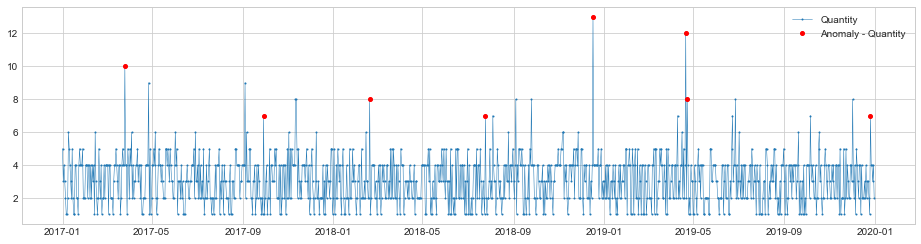

In [113]:
# from adtk.detector import SeasonalAD
from adtk.detector import PersistAD
persist_ad = PersistAD(side='positive') # only look for abnormally high number of reviews of a particular product on a particular day
anomalies = persist_ad.fit_detect(s_train)

from adtk.visualization import plot
plot(s_train, anomaly=anomalies, anomaly_color="red", anomaly_tag="marker")


<div class="alert alert-warning">

### The model has been built to search for:
- anomolous count of reviews on a product by day
- filtered to only "positive" changes
    
revealed the below anomalies



In [114]:
anomalies.dropna(inplace=True)
anomalies[anomalies['Quantity']==1]

,Quantity
ReviewDate,
2017-03-26,1.0
2017-09-29,1.0
2018-02-19,1.0
2018-07-25,1.0
2018-12-17,1.0
2019-04-21,1.0
2019-04-23,1.0
2019-12-26,1.0


<div class="alert alert-success">  
    
# 2) Detect credit card fraud
    

</div>

In [116]:
transactions.Sales

0         37.45
1       1187.87
2         17.96
3        554.72
4         42.47
         ...   
9995     359.05
9996    4208.35
9997    1051.04
9998      15.65
9999     765.89
Name: Sales, Length: 10000, dtype: float64

In [194]:
df_cc = transactions[['CreditCardNumber', 'DeliveryZipCode','PurchaseDate','Sales', 'HomeZipCode']] \
    .sort_values(['CreditCardNumber', 'DeliveryZipCode','PurchaseDate','Sales'])

In [195]:
def fraud_rules(df_cc):
    cur_card = None
    cur_zip = None
    curPurchDate = pd.to_datetime(datetime(1970, 1, 1, 0, 0, 0))
    df_cc['isFraud'] = None

    for i, row in df_cc.iterrows():
        if datetime.date(pd.to_datetime(row.PurchaseDate)) == datetime.date(pd.to_datetime(curPurchDate)) and \
            row.DeliveryZipCode != cur_zip and \
            cur_card == row.CreditCardNumber and \
            row.Sales > 1000:
                df_cc['isFraud'][i] = 1

        elif abs((pd.to_datetime(row.PurchaseDate) - pd.to_datetime(curPurchDate)).total_seconds() / 60) < 30 and \
            row.DeliveryZipCode != cur_zip and \
            cur_card == row.CreditCardNumber and \
            row.PurchaseDate - curPurchDate:
                df_cc['isFraud'][i] = 1
        else:
            df_cc['isFraud'][i] = 0

        cur_card = row.CreditCardNumber
        cur_zip = row.DeliveryZipCode
        curPurchDate = row.PurchaseDate
    
    return df_cc

df_cc = fraud_rules(df_cc)

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 1


In [196]:
# find transactions marked as fraud
df_cc[df_cc.isFraud==1]

,CreditCardNumber,DeliveryZipCode,PurchaseDate,Sales,HomeZipCode,isFraud
3673,xxxx-xxxx-xxxx-1884,90077,2018-05-08,5974.29,90077,1
6484,xxxx-xxxx-xxxx-7823,75295,2019-12-30,1053.78,75295,1


In [197]:
df_cc[df_cc.CreditCardNumber=='xxxx-xxxx-xxxx-7823']

,CreditCardNumber,DeliveryZipCode,PurchaseDate,Sales,HomeZipCode,isFraud
6430,xxxx-xxxx-xxxx-7823,33196,2019-12-30,102.17,33196,0
6484,xxxx-xxxx-xxxx-7823,75295,2019-12-30,1053.78,75295,1


<div class="alert alert-warning">

### rules validated, but we're going to need a bigger boat. 
a model is not very trainable on only 2 samples
    


In [198]:
df_cc = transactions[['CreditCardNumber', 'DeliveryZipCode','PurchaseDate','Sales', 'HomeZipCode']] \
    .sort_values(['CreditCardNumber', 'DeliveryZipCode','PurchaseDate','Sales'])

# duplicate rows 4 times
df_cc = pd.concat([df_cc]*5)

# redsitribute time
df_cc.PurchaseDate = random_dates('2017-01-01', '2020-01-01', len(df_cc.PurchaseDate))
df_cc


,CreditCardNumber,DeliveryZipCode,PurchaseDate,Sales,HomeZipCode
8820,xxxx-xxxx-xxxx-0000,75212,2018-01-03 20:13:35,5615.45,75212
1187,xxxx-xxxx-xxxx-0004,33132,2018-12-20 20:55:07,63.72,33132
6254,xxxx-xxxx-xxxx-0004,75227,2018-06-20 01:42:24,1028.61,75227
6238,xxxx-xxxx-xxxx-0004,90011,2017-06-03 05:56:42,987.53,90011
4182,xxxx-xxxx-xxxx-0005,10257,2017-03-04 23:46:20,2403.35,10257
...,...,...,...,...,...
6393,xxxx-xxxx-xxxx-9996,30315,2018-09-10 09:16:21,1536.10,30315
9813,xxxx-xxxx-xxxx-9996,33163,2018-10-27 03:36:49,3381.22,33163
1659,xxxx-xxxx-xxxx-9997,75301,2018-04-05 07:05:38,4701.23,75301
7874,xxxx-xxxx-xxxx-9998,75398,2018-01-28 10:54:59,31.71,75398


In [199]:
df_cc = fraud_rules(df_cc)

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-195-145f3ba1d853>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

In [202]:
# find transactions marked as fraud
len(df_cc[df_cc.isFraud==1])

10

In [203]:
# the size of this DF seems to be killling  my performance, so i'm going to clear it out
df_cc = None

<div class="alert alert-warning">

### 10/50,000 transacitons is still too low. i expected more when I increased the density of transactions 
per unit of time; but it wasn't enough
    


In [233]:
df_cc = transactions[['CreditCardNumber', 'DeliveryZipCode','PurchaseDate','Sales', 'HomeZipCode']] \
    .sort_values(['CreditCardNumber', 'DeliveryZipCode','PurchaseDate','Sales'])

# redsitribute time in smaller window
df_cc.PurchaseDate = random_dates('2019-01-01', '2020-01-01', len(df_cc.PurchaseDate))
df_cc

def synthesize_fraud(df_cc):
    cur_card = None
    cur_zip = None
    curPurchDate = pd.to_datetime(datetime(1970, 1, 1, 0, 0, 0))
    df_cc['time_diff'] = None
    df_cc['same_zip'] = None
    df_cc['isFraud'] = None

    for i, row in df_cc.iterrows(): # use a little fizzbuzz inspiration:  prime numbers to make "random transactions" fraud
        if i % 17 == 0: # set to a new zip code with a high transaction amt
            df_cc['isFraud'][i] = 1
            df_cc['DeliveryZipCode'][i] = random.choice(df_cc.DeliveryZipCode)
            df_cc['Sales'][i] = random.randint(100000,1000000)/100 # random value between $1000.00-10000.00


        if i % 19 ==0: # set the zip code randomly different and 20sec later
            df_cc['isFraud'][i] = 1
            df_cc['DeliveryZipCode'][i] = random.choice(df_cc.DeliveryZipCode)
            df_cc['PurchaseDate'][i] = curPurchDate + timedelta(0,20)
        
        else:
            df_cc['isFraud'][i] = 0

        cur_card = row.CreditCardNumber
        cur_zip = row.DeliveryZipCode
        curPurchDate = row.PurchaseDate
        
        # new features for model. time since last transaction & whether the zip has changed
        df_cc['time_diff'][i]  = abs((pd.to_datetime(row.PurchaseDate) - pd.to_datetime(curPurchDate)).total_seconds() / 60)
        df_cc['same_zip'][i] = True
        if row.DeliveryZipCode != cur_zip:
            df_cc['same_zip'][i] = False
    
    return df_cc

df_cc = synthesize_fraud(df_cc)

<ipython-input-233-1d57619c4ae1>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['isFraud'][i] = 0
<ipython-input-233-1d57619c4ae1>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['time_diff'][i]  = abs((pd.to_datetime(row.PurchaseDate) - pd.to_datetime(curPurchDate)).total_seconds() / 60)
<ipython-input-233-1d57619c4ae1>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cc['same_zip'][i] = True
<ipython-input-233-1d

In [241]:
# find transactions marked as fraud
len(df_cc[df_cc.isFraud==1])

527

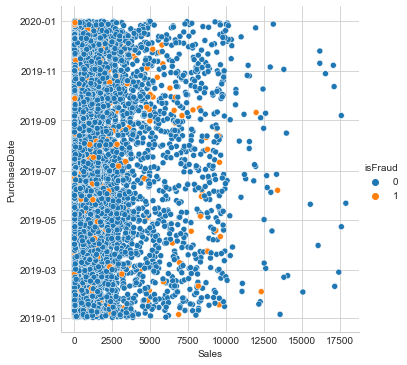

In [235]:
import seaborn as sns
sns.relplot(x='Sales', y='PurchaseDate', hue='isFraud',data=df_cc)

In [258]:
# ref: https://stackabuse.com/random-forest-algorithm-with-python-and-scikit-learn
X=df_cc[['time_diff', 'same_zip', 'Sales']]  # Features
y=df_cc['isFraud'].astype('int')  # Labels
pd.DataFrame(y).value_counts()

isFraud
0          9473
1           527
dtype: int64

In [259]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)


In [260]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)


In [261]:
X_train

array([[ 0.        ,  0.        ,  1.54802273],
       [ 0.        ,  0.        , -0.55440533],
       [ 0.        ,  0.        , -0.37944587],
       ...,
       [ 0.        ,  0.        , -0.53693721],
       [ 0.        ,  0.        , -0.38197837],
       [ 0.        ,  0.        , -0.30106097]])

In [265]:
from sklearn.ensemble import RandomForestClassifier 

clf = RandomForestClassifier(max_depth=2, random_state=0)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test).argmax


In [264]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(accuracy_score(y_test, y_pred))


[[1903    0]
 [  97    0]]
              precision    recall  f1-score   support

           0       0.95      1.00      0.98      1903
           1       0.00      0.00      0.00        97

    accuracy                           0.95      2000
   macro avg       0.48      0.50      0.49      2000
weighted avg       0.91      0.95      0.93      2000

0.9515


C:\Users\steve\miniconda3\envs\streaming\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\steve\miniconda3\envs\streaming\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\steve\miniconda3\envs\streaming\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<div class="alert alert-warning">

### due to imbalanced class, this is a poor model
    


<div class="alert alert-info">   
    
## 2. implementation of the disaster recovery and contingency plan for OnMart logistics and supply chain network

        - Find a backupwarehouse for every serving warehouse in the state of Florida
        - the backup warehouse must be the farthest warehouse that has the lowest number of shipments 
        - within 150-200 miles radius for every serving warehouse.

    
</div>

In [1]:
from neo4j import GraphDatabase
class Neo4jConnection:
    
    def __init__(self, uri, user, pwd):
        self.__uri = uri
        self.__user = user
        self.__pwd = pwd
        self.__driver = None
        try:
            self.__driver = GraphDatabase.driver(self.__uri, auth=(self.__user, self.__pwd))
        except Exception as e:
            print("Failed to create the driver:", e)
        
    def close(self):
        if self.__driver is not None:
            self.__driver.close()
        
    def query(self, query, db=None):
        assert self.__driver is not None, "Driver not initialized!"
        session = None
        response = None
        try: 
            session = self.__driver.session(database=db) if db is not None else self.__driver.session() 
            response = list(session.run(query))
        except Exception as e:
            print("Query failed:", e)
        finally: 
            if session is not None:
                session.close()
        return response


In [2]:
conn = Neo4jConnection(uri="bolt://localhost:7687", user="pyRead", pwd="pyRead")

In [7]:
df = pd.read_csv('./Transactions.csv')
df = df.dropna()
df['Delivery_Zip_Code'] = df['Delivery_Zip_Code'].astype(int)
df.head()

,CustomerID,FirstName,LastName,CreditCardNumber,OrderID,Customer_Occupation,Credit_Card_Number,Order_ID,Order_Date,Expected_Delivery_Date,...,Product_Name,Category,Manufacturer,Review_Rating,Delivery_Tracking_ID,Delivery_Type,Delivery_Zip_Code,Transaction_Status,Order_Returned,Order_Delivered_on_Time
0,566-26-0321,Rebeka,Stokes,xxxx-xxxx-xxxx-2650,50787284-d78d-4b6a-b93f-7419b0d46590,Lawyer,12345789032,98,4/7/2020,4/11/2020,...,Fitbit small,fitness,Fitbit small,3,98,Pickup,10048,Disputed,1,1
1,274-18-0017,Rahsaan,Koch,xxxx-xxxx-xxxx-5055,f61639d7-28de-4507-a63a-71e99921d8f9,Lawyer,12345789032,131,5/10/2020,5/14/2020,...,Fitbit small,fitness,Fitbit small,3,131,Pickup,10048,Disputed,1,1
2,455-28-7950,Zion,Osinski,xxxx-xxxx-xxxx-0150,7b1caf69-bd5b-441c-9115-6fa31ba1c313,Lawyer,12345789032,318,11/13/2020,11/17/2020,...,Fitbit small,fitness,Fitbit small,3,318,Pickup,10048,Disputed,1,1
3,254-72-5938,Ward,Brekke,xxxx-xxxx-xxxx-5280,cb58e8e9-572b-4d9e-af9f-dbecf9dfd3c5,Actor,12345789032,528,2/12/2020,2/16/2020,...,Fitbit large,fitness,Fitbit large,5,528,Pickup,10048,Disputed,0,1
4,563-47-8401,Terrence,Franecki,xxxx-xxxx-xxxx-1019,a9d66460-a48f-419f-8d39-7818290a3041,Actor,12345789032,561,2/12/2020,2/16/2020,...,Fitbit large,fitness,Fitbit large,5,561,Pickup,10048,Disputed,0,1


In [9]:
df_wd = pd.read_csv('./Warehouse_Distribution_Centers.csv')
df_wd.head()

,Zip,City,State,Latitude,Longitude,Facility_ID at given Location/Zip,Distribution Center ID Serving this Zip Code,Warehouse ID supplying this Distribution Center
0,60651,Chicago,IL,41.901485,-87.74055,Warehouse_1,DistributionCenter_1,Warehouse_1
1,60697,Chicago,IL,41.811929,-87.68732,NaN,DistributionCenter_1,Warehouse_1
2,60667,Chicago,IL,41.811929,-87.68732,NaN,DistributionCenter_1,Warehouse_1
3,60694,Chicago,IL,41.811929,-87.68732,NaN,DistributionCenter_1,Warehouse_1
4,60684,Chicago,IL,41.811929,-87.68732,NaN,DistributionCenter_1,Warehouse_1


In [10]:
df_merged = df.merge(df_wd.rename(columns={'Zip':'Delivery_Zip_Code',
                                   ' Distribution Center ID Serving this Zip Code':'distro_id',
                                   'Warehouse ID supplying this Distribution Center':'warehouse_id'}),
             on='Delivery_Zip_Code',
             how='left')
display(df_merged.columns)
start_date = min(df_merged.Order_Date)
end_date = max(df_merged.Order_Date)
delta = end_date - start_date
df_merged

Index(['CustomerID', 'FirstName', 'LastName', 'CreditCardNumber', 'OrderID',
       'Customer_Occupation', 'Credit_Card_Number', 'Order_ID', 'Order_Date',
       'Expected_Delivery_Date', 'Actual_Delivery_Date', 'Product_ID',
       'Product_Name', 'Category', 'Manufacturer', 'Review_Rating',
       'Delivery_Tracking_ID', 'Delivery_Type', 'Delivery_Zip_Code',
       'Transaction_Status', 'Order_Returned', 'Order_Delivered_on_Time',
       'City', 'State', 'Latitude', 'Longitude',
       'Facility_ID at given Location/Zip', 'distro_id', 'warehouse_id'],
      dtype='object')

,CustomerID,FirstName,LastName,CreditCardNumber,OrderID,Customer_Occupation,Credit_Card_Number,Order_ID,Order_Date,Expected_Delivery_Date,...,Transaction_Status,Order_Returned,Order_Delivered_on_Time,City,State,Latitude,Longitude,Facility_ID at given Location/Zip,distro_id,warehouse_id
0,566-26-0321,Rebeka,Stokes,xxxx-xxxx-xxxx-2650,50787284-d78d-4b6a-b93f-7419b0d46590,Lawyer,12345789032,98,4/7/2020,4/11/2020,...,Disputed,1,1,New York,NY,40.712086,-74.012270,NaN,DistributionCenter_13,Warehouse_4
1,274-18-0017,Rahsaan,Koch,xxxx-xxxx-xxxx-5055,f61639d7-28de-4507-a63a-71e99921d8f9,Lawyer,12345789032,131,5/10/2020,5/14/2020,...,Disputed,1,1,New York,NY,40.712086,-74.012270,NaN,DistributionCenter_13,Warehouse_4
2,455-28-7950,Zion,Osinski,xxxx-xxxx-xxxx-0150,7b1caf69-bd5b-441c-9115-6fa31ba1c313,Lawyer,12345789032,318,11/13/2020,11/17/2020,...,Disputed,1,1,New York,NY,40.712086,-74.012270,NaN,DistributionCenter_13,Warehouse_4
3,254-72-5938,Ward,Brekke,xxxx-xxxx-xxxx-5280,cb58e8e9-572b-4d9e-af9f-dbecf9dfd3c5,Actor,12345789032,528,2/12/2020,2/16/2020,...,Disputed,0,1,New York,NY,40.712086,-74.012270,NaN,DistributionCenter_13,Warehouse_4
4,563-47-8401,Terrence,Franecki,xxxx-xxxx-xxxx-1019,a9d66460-a48f-419f-8d39-7818290a3041,Actor,12345789032,561,2/12/2020,2/16/2020,...,Disputed,0,1,New York,NY,40.712086,-74.012270,NaN,DistributionCenter_13,Warehouse_4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16367,564-40-9827,Madie,Mayert,xxxx-xxxx-xxxx-1592,1b69b9ee-3017-429e-9e1b-9994ead619c0,Lawyer,12345789032,11949,6/7/2019,6/11/2019,...,Disputed,1,1,Los Angeles,CA,33.783038,-118.238683,DistributionCenter_37,DistributionCenter_37,Warehouse_12
16368,627-64-3054,Vincent,Ondricka,xxxx-xxxx-xxxx-9291,27f2841e-27cd-42d0-8000-f99b7ad7711d,Lawyer,12345789032,12033,8/30/2019,9/3/2019,...,Disputed,1,1,Los Angeles,CA,33.783038,-118.238683,DistributionCenter_37,DistributionCenter_37,Warehouse_12
16369,564-40-9827,Madie,Mayert,xxxx-xxxx-xxxx-1592,46db23f8-a2aa-48e1-96c4-9c07e89ad8eb,Lawyer,12345789032,12236,2/25/2019,3/1/2019,...,Disputed,1,1,Los Angeles,CA,33.783038,-118.238683,DistributionCenter_37,DistributionCenter_37,Warehouse_12
16370,416-42-9023,Lonzo,Tromp,xxxx-xxxx-xxxx-8745,dbffba44-ac7c-41d5-adfb-5298be07d057,Actor,12345789032,12293,1/21/2019,1/25/2019,...,Disputed,0,1,Los Angeles,CA,33.783038,-118.238683,DistributionCenter_37,DistributionCenter_37,Warehouse_12


In [49]:
df_merged['Order_Date'] = pd.to_datetime(df_merged['Order_Date'])

start_date = min(df_merged.Order_Date)
end_date = max(df_merged.Order_Date)
delta = end_date - start_date


df_return_avgs = pd.DataFrame(df_merged.groupby('warehouse_id')['OrderID'].count()/delta.days).sort_values('OrderID', ascending=False)
df_return_avgs

,OrderID
warehouse_id,
Warehouse_1,2.441096
Warehouse_18,2.204566
Warehouse_4,1.874886
Warehouse_16,1.870320
Warehouse_12,1.768950
Warehouse_13,1.143379
Warehouse_2,0.881279
Warehouse_19,0.719635
Warehouse_17,0.625571


<div class="alert alert-warning">

### list of distances for a single warehouse
    


In [33]:
query_string = '''
MATCH (Warehouse_1:Warehouse {facility_id: "Warehouse_1"}) 
MATCH (w:Warehouse)
with 
    w.facility_id as Warehouse_id, 
    distance(Point({latitude:Warehouse_1.latitude, longitude:Warehouse_1.longitude}), Point({latitude:w.latitude,
        longitude:w.longitude})) * 0.000621371 
        as distance
RETURN Warehouse_id, distance
order by distance asc
'''
closest_warehouses = pd.DataFrame([dict(_) for _ in conn.query(query_string, db='neo4j')])
closest_warehouses

,Warehouse_id,distance
0,Warehouse_1,0.000000
1,Warehouse_2,5.229928
2,Warehouse_3,5.898415
3,Warehouse_4,718.175409
4,Warehouse_8,718.175409
5,Warehouse_9,718.175409
6,Warehouse_7,718.397468
7,Warehouse_5,718.560494
8,Warehouse_6,718.641918
9,Warehouse_22,796.150054


<div class="alert alert-warning">

### list of warehouse farthest from each warehouse
    


In [35]:
for i in df_return_avgs.index:
    query_string = '''
    MATCH (target:Warehouse {{facility_id: "{0}"}}) 
    MATCH (w:Warehouse)
    with 
        w.facility_id as Warehouse_id, 
        distance(Point({{latitude:target.latitude, longitude:target.longitude}}), Point({{latitude:w.latitude,
            longitude:w.longitude}})) * 0.000621371 
            as distance
    RETURN Warehouse_id, distance
    ORDER BY distance desc
    limit 1
    '''.format(i)
    print(i, ':' , conn.query(query_string, db='neo4j'))

Warehouse_1 : [<Record Warehouse_id='Warehouse_14' distance=1748.3163418594918>]
Warehouse_18 : [<Record Warehouse_id='Warehouse_10' distance=1550.50469591562>]
Warehouse_16 : [<Record Warehouse_id='Warehouse_14' distance=2337.5675520271916>]
Warehouse_4 : [<Record Warehouse_id='Warehouse_14' distance=2459.2691151289273>]
Warehouse_12 : [<Record Warehouse_id='Warehouse_10' distance=2597.041302738496>]
Warehouse_13 : [<Record Warehouse_id='Warehouse_10' distance=2589.489080182868>]
Warehouse_2 : [<Record Warehouse_id='Warehouse_14' distance=1750.9256529462562>]
Warehouse_19 : [<Record Warehouse_id='Warehouse_10' distance=1550.50469591562>]
Warehouse_17 : [<Record Warehouse_id='Warehouse_14' distance=2339.664500647827>]
Warehouse_15 : [<Record Warehouse_id='Warehouse_14' distance=2339.664500647827>]
Warehouse_3 : [<Record Warehouse_id='Warehouse_14' distance=1753.8441795242845>]
Warehouse_5 : [<Record Warehouse_id='Warehouse_14' distance=2459.441340245832>]


<div class="alert alert-warning">

### 500mi seems a safe distance to avoid; then seek the least busy warehouse less than 1000mi away
    


In [45]:
backup_warehouse_options = pd.DataFrame()


for i in df_return_avgs.index:
    query_string = '''
    MATCH (target:Warehouse {{facility_id: "{0}"}}) 
    MATCH (w:Warehouse)
    with 
        w.facility_id as backup, 
        distance(Point({{latitude:target.latitude, longitude:target.longitude}}), Point({{latitude:w.latitude,
            longitude:w.longitude}})) * 0.000621371 
            as distance,
        target.facility_id as target
    WHERE distance > 500 AND distance < 1000
    RETURN target, backup, distance
    ORDER BY distance desc
    '''.format(i)
    res = pd.DataFrame([dict(_) for _ in conn.query(query_string, db='neo4j')])
    backup_warehouse_options = backup_warehouse_options.append(res)


backup_warehouse_options

,target,backup,distance
0,Warehouse_1,Warehouse_10,855.060466
1,Warehouse_1,Warehouse_11,854.719299
2,Warehouse_1,Warehouse_18,802.871539
3,Warehouse_1,Warehouse_19,802.871539
4,Warehouse_1,Warehouse_21,802.871539
5,Warehouse_1,Warehouse_20,801.567508
6,Warehouse_1,Warehouse_22,796.150054
7,Warehouse_1,Warehouse_6,718.641918
8,Warehouse_1,Warehouse_5,718.560494
9,Warehouse_1,Warehouse_7,718.397468


<div class="alert alert-warning">

### 1000mi cap resulted in some warehouses finding no backup. need to remove req
    


In [68]:
backup_warehouse_options = pd.DataFrame()


for i in df_return_avgs.index:
    query_string = '''
    MATCH (target:Warehouse {{facility_id: "{0}"}}) 
    MATCH (w:Warehouse)
    with 
        w.facility_id as backup, 
        distance(Point({{latitude:target.latitude, longitude:target.longitude}}), Point({{latitude:w.latitude,
            longitude:w.longitude}})) * 0.000621371 
            as distance,
        target.facility_id as target
    WHERE distance > 500 
    RETURN target, backup, distance
    ORDER BY distance desc
    '''.format(i)
    res = pd.DataFrame([dict(_) for _ in conn.query(query_string, db='neo4j')])
    backup_warehouse_options = backup_warehouse_options.append(res)


backup_warehouse_options

,target,backup,distance
0,Warehouse_1,Warehouse_14,1748.316342
1,Warehouse_1,Warehouse_12,1741.985043
2,Warehouse_1,Warehouse_13,1734.440829
3,Warehouse_1,Warehouse_15,1204.400092
4,Warehouse_1,Warehouse_17,1204.400092
...,...,...,...
9,Warehouse_5,Warehouse_17,1115.323245
10,Warehouse_5,Warehouse_16,1113.188870
11,Warehouse_5,Warehouse_1,718.560494
12,Warehouse_5,Warehouse_2,716.771590


In [69]:
backup_warehouse_business = backup_warehouse_options.merge(df_return_avgs.reset_index().rename(columns={
                                   'warehouse_id':'backup',
                                    'OrderID':'avg_orders'}),
             on='backup',
             how='left')


In [77]:
backup_warehouse_business.groupby('target').min('avg_orders').reset_index().merge(
    df_return_avgs.reset_index().rename(columns={
                                   'warehouse_id':'backup',
                                    'OrderID':'avg_orders'}),
             on='avg_orders',
     how='left'
    )[['target','backup', 'avg_orders', 'distance']]

,target,backup,avg_orders,distance
0,Warehouse_1,Warehouse_5,0.364384,718.175409
1,Warehouse_12,Warehouse_5,0.364384,1239.946835
2,Warehouse_13,Warehouse_5,0.364384,1231.220529
3,Warehouse_15,Warehouse_5,0.364384,1102.844477
4,Warehouse_16,Warehouse_5,0.364384,1100.528229
5,Warehouse_17,Warehouse_5,0.364384,1102.844477
6,Warehouse_18,Warehouse_5,0.364384,802.871539
7,Warehouse_19,Warehouse_5,0.364384,802.871539
8,Warehouse_2,Warehouse_5,0.364384,716.374704
9,Warehouse_3,Warehouse_5,0.364384,712.384736


<div class="alert alert-warning">

### a real contingency plan may want to add a secondary backup for each to avoid having 10/12 warehouses using the same backup. it being the least busy may also mean it's the least capable of handling a rush
    
